<a href="https://colab.research.google.com/github/werowe/HypatiaAcademy/blob/master/coursera_sequence_models_intro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[Coursera](https://www.coursera.org/learn/nlp-sequence-models/lecture/aJT8i/notation)


* **named entity recognition** identity where in text words are found.  does this with kind of a 1-hot encoding


temporal position in input:

$x^{<1>}, x^{<2>}, ...$.  words

$y^{<1>}, y^{<2>}, ...$.  output

$T_x^{(i)}$ length of sequence of training example i

$T_y^{(i)}$ length of output



$x^{(i)<t>}$ t-th element of sequence in the i-th training example


# Vocabulary

words used in your dictionary


#Recurrent Neural Network
unidirectional cannot look ahead and use later words in squence

At each time step the RNN passes on it's activation to the next time stamp.

$a^{<0>}$ initial activation, usually zeros

$W_{ax}$ shared parameters passed to every layer

$W_{aa}$ shared paramets for activations

$W_{yx}$ shared parameters for output predictions

**Notation**:
- Superscript $[l]$ denotes an object associated with the $l^{th}$ layer.

- Superscript $(i)$ denotes an object associated with the $i^{th}$ example.

- Superscript $\langle t \rangle$ denotes an object at the $t^{th}$ time
step.
    
- Subscript $i$ denotes the $i^{th}$ entry of a vector.

**Example**:  
- $a^{(2)[3]<4>}_5$ denotes the activation of the 2nd training example (2), 3rd layer [3], 4th time step <4>, and 5th entry in the vector.




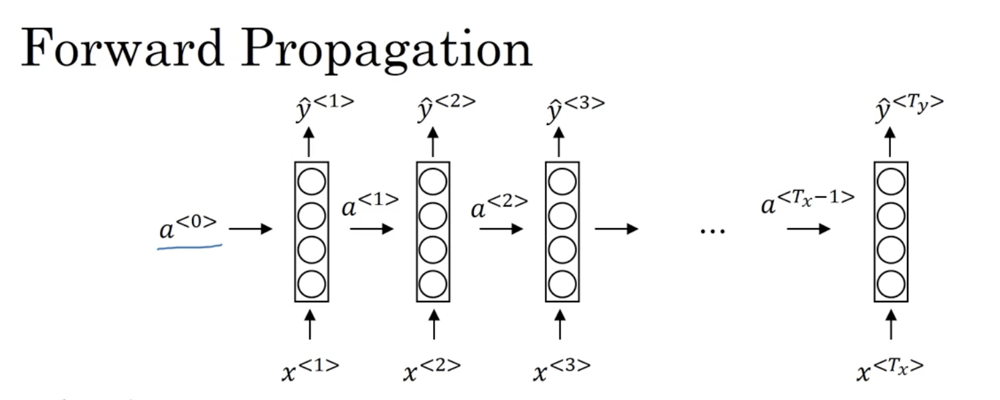

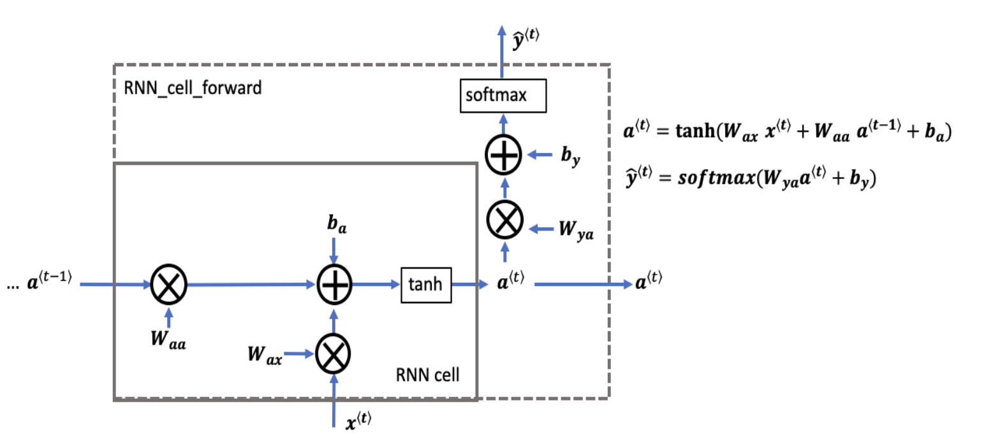

Take the two vectors and stack them.

general form at time t

$a^{<t>}=g(W_{aa}a^{<t - 1>} + W_{ax}X^{<t>} + b_a)$

$ŷ ^{<t>}=g(W_{ya}a^{,t>} + b_y)$

Simplify to creare $W_a$ by stacking $W_{aa}$ and $W_{ax}$ side by side then we can write:

$a^{<t>} = g(W_a[a^{<t-1>},X^{<t>}] + b_a)$

and simplify ya to y:

$a^{<t>}=g(W_{y}a^{,t>} + b_y)$



# Backpropagation

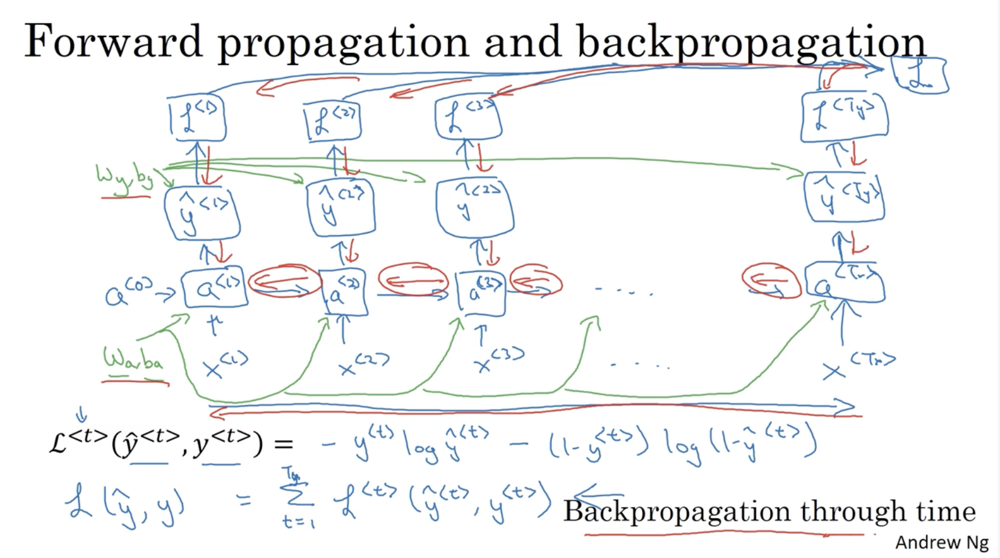

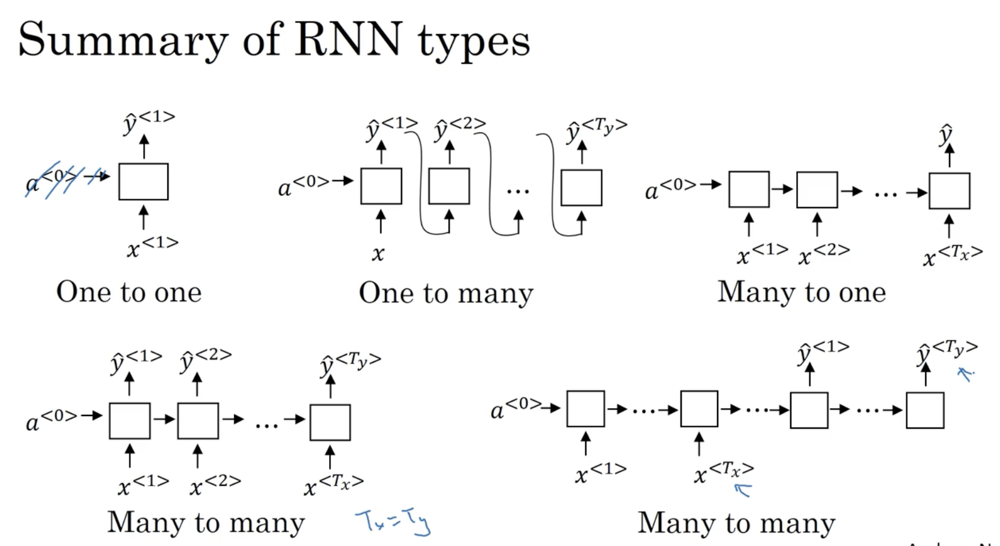

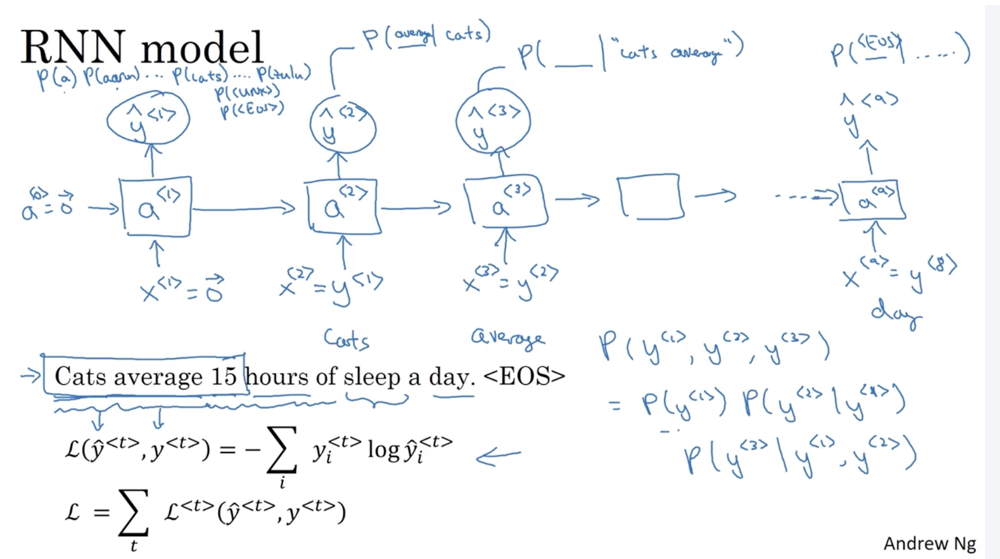



$p(y^{<1>},y^{<2>} y^{<3>}) = P(y^{<1>})P(y^{<2>} | y^{<1>})P(y^{<3>} | y^{<1>}, y^{<2>})$

$ℒ(ŷ^{<t>}, y^{<t>}) = - \sum_{i} y_i^{<t>}log ŷ_i^{<t>}$

**softmax loss**

$ℒ = \sum_{i} ℒ^{<t>}(ŷ^{<t>},y^{<t>})$

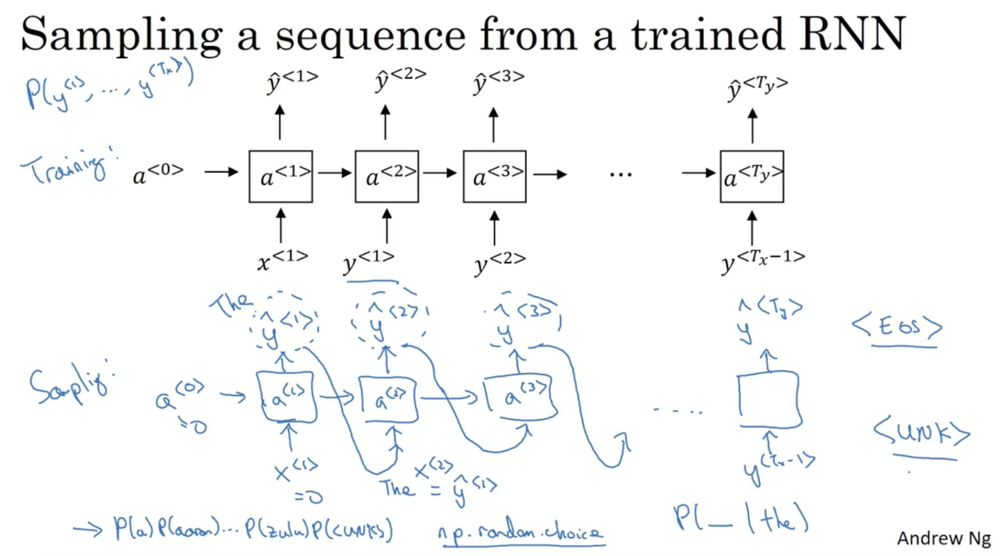



# Sampling a Sequence from a Trained RNN

This describes the process of using a trained RNN to generate (sample) sequences, as illustrated in the image. This technique is often used in language models, text generation, and similar applications.

---

## Purpose

- **Training phase:** During training, the RNN learns to predict the next element in a sequence (e.g., next word) given previous elements.
- **Sampling (generation) phase:** After training, we use the RNN to generate new sequences by sampling predicted outputs one step at a time and feeding them back as inputs for the next step.

---

## Algorithm Explanation

### 1. Training Phase

- Each RNN cell receives:
  - The previous hidden state $a^{\langle t-1 \rangle}$
  - The actual input $x^{\langle t \rangle}$ (or ground truth $y^{\langle t-1 \rangle}$ for teacher forcing)
- The RNN predicts $\hat{y}^{\langle t \rangle}$ at each step.
- The process is repeated for each time step up to $T_y$.

**Diagram:**


### 2. Sampling (Sequence Generation) Phase

- Initialize $a^{<0>}$ (often set to zero or a learned vector).
- At each time step, do the following:
  1. **Input for first step:** Often a special start token (e.g., "<start>") or a seed value.
  2. **Predict next value:** Feed the input and current hidden state into the RNN to get output probabilities for the next token.
  3. **Sample the output:** Randomly select $\hat{y}^{\langle t \rangle}$ from the probability distribution (e.g., with `np.random.choice`).
  4. **Feed sampled value:** The sampled $\hat{y}^{\langle t \rangle}$ becomes the input $x^{\langle t+1 \rangle}$ for the next step.
  5. **Repeat** until a special end token (“<EOS>”) is produced or a maximum length is reached.

**Step-by-step:**
- $a^{<0>} = 0$
- $x^{<1>} =$ "<start>" or seed
- For $t = 1$ to $T_y$:
    - $a^{<t>} = \text{RNN}(a^{<t-1>}, x^{<t>})$
    - $\hat{y}^{<t>} = \text{Sample}(\text{softmax output})$
    - $x^{<t+1>} = \hat{y}^{<t>}$

---

## Notes

- **<EOS>** (End of Sequence): Signals the end of output.
- **<UNK>** (Unknown): Used for unknown or out-of-vocabulary tokens.
- **Probabilities:** The overall probability of producing a sequence is the product of the conditional probabilities at each step.

**Example:**








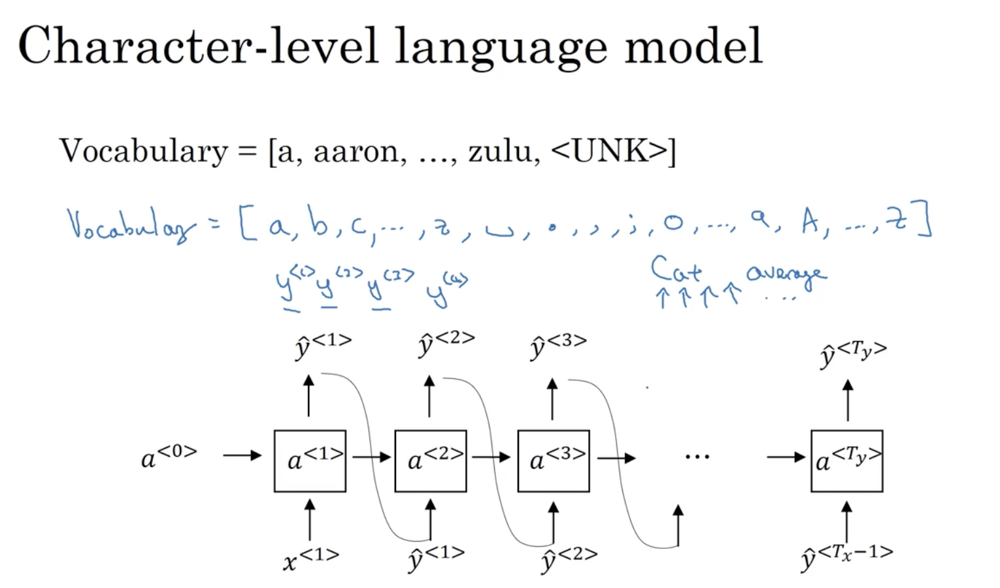

## Disadvantages of RNN

* Much longer sequence is main disadvantage of RNN

* more comutationally experience


#Vanishing Gradients

Like 100 later network if this is a very deep network it will have a hard time propagating back to update the weights.  It's hard for output to be influence to something which is far away.

**exploding gradients** is bigger problems but exponentially gradients big problem but harder to spot but you might find NANs one solution is to apply **gradient clipping**.

**GRU** is soluton


#Gated Recurrent Unit (GRU)

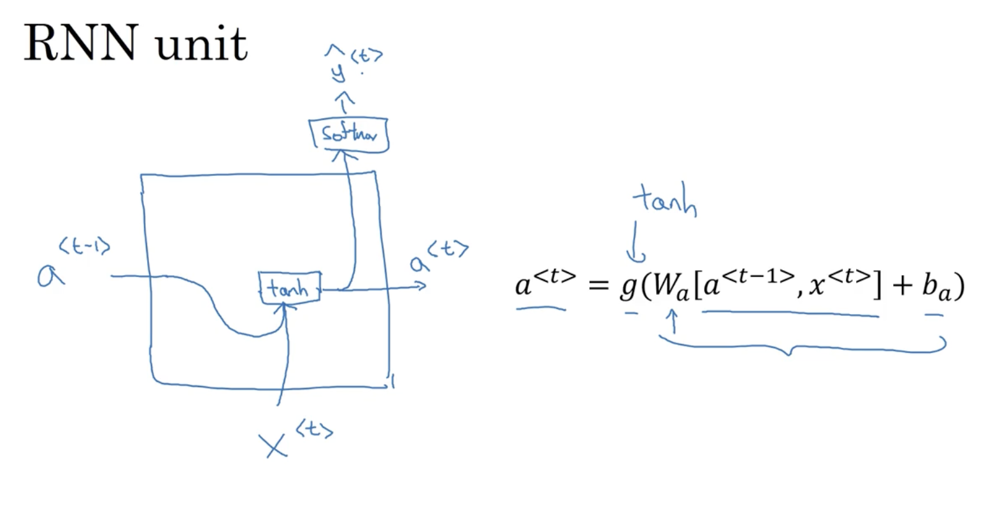

Must remember that cat was singular and thus was must be singular:

* The cat ... was full.
* The cats ... were full.

$a^{<t>} = g(W_a[a^{<t-1>},x^{<t>}] + b_a)$

# RNN Unit Explanation

This explains the RNN unit as shown in your image.

---

## Diagram Overview

- The **box** represents a single RNN cell at time step $t$.
- **Inputs to the cell:**
  - $a^{\langle t-1 \rangle}$: the activation (or hidden state) from the previous time step.
  - $x^{\langle t \rangle}$: the current input at time $t$ (for example, this could be the current word in a sentence).

- **Inside the cell:**
  - $a^{\langle t-1 \rangle}$ and $x^{\langle t \rangle}$ are combined and passed through a function that includes a linear transformation and a $\tanh$ nonlinearity. This produces the new hidden state $a^{\langle t \rangle}$.
  - The new hidden state $a^{\langle t \rangle}$ is then sent out of the box to serve both as the output of this time step and as the input to the next cell.

- **Output:**
  - The activation $a^{\langle t \rangle}$ is also sent to a softmax layer to produce an output $\hat{y}^{\langle t \rangle}$ for this time step (for example, predicting the next word).

---

## Formula

The key equation is:

$$
a^{\langle t \rangle} = g\left(W_a \begin{bmatrix} a^{\langle t-1 \rangle} \\ x^{\langle t \rangle} \end{bmatrix} + b_a\right)
$$

- $W_a$: weight matrix for the RNN cell.
- $\begin{bmatrix} a^{\langle t-1 \rangle} \\ x^{\langle t \rangle} \end{bmatrix}$: concatenation of previous hidden state and current input.
- $b_a$: bias term.
- $g$: nonlinearity function, typically $\tanh$.
- $a^{\langle t \rangle}$: updated hidden state (also called memory or activation).

---

## Step-by-Step Operations

1. **Input Processing:** Combine previous hidden state $a^{\langle t-1 \rangle}$ with current input $x^{\langle t \rangle}$.
2. **Linear Transformation:** Multiply by $W_a$ and add bias $b_a$.
3. **Activation:** Apply the $\tanh$ nonlinearity to get the new hidden state $a^{\langle t \rangle}$.
4. **Output:** Use $a^{\langle t \rangle}$ to compute the output for the current step (with a softmax, if needed).

---

**Summary:**  
An RNN unit at each time step takes in the previous hidden state and the current input, processes both to produce a new hidden state, and then uses that hidden state both as output and as input for the next time step. This structure enables RNNs to model sequences and remember information across them.






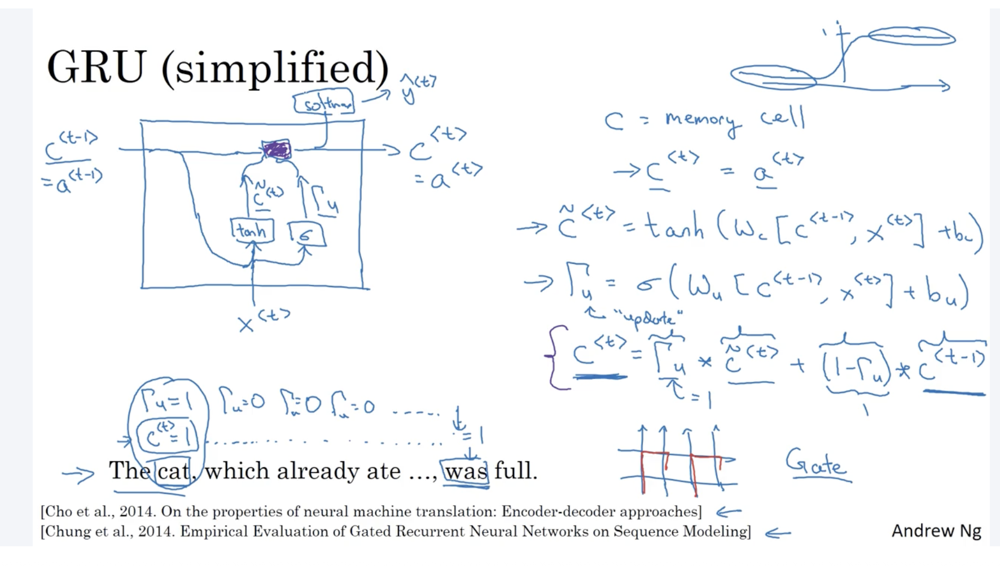

# GRU (Gated Recurrent Unit) – Simplified Algorithm

Γ is so close to 0 like 0.00000001 because of sigmoing function for large negative numbers thatt this does a good job of remembers the original value.eaning $C^{<t>}$ is remember a long sequence./.

$C^{<t>}$ could also be a vector.  In that case the * is element-wise multiplication. The bits in this vector tell you what items you want to update like case, food, whatever.  Which are the dimensions of the memory cell vector to update at each time stamp.  

---

## Notation

The **cat** which already ate ... was **full**.

- $C$: memory cell (often called the hidden state, sometimes $h$), for exampe remember is a word was singular or plural
- $x^{\langle t \rangle}$: input at time step $t$
- $C^{\langle t-1 \rangle}$: memory cell (hidden state) from previous step
- $\tilde{C}^{\langle t \rangle}$: candidate memory cell/update. Here consider overwriting the memory cell $C^{<t>}$.
- $\Gamma_u$: update gate (values in [0, 1]). Think of it as 0 or 1 since most values in sigmoid are close to 0 or 1.
- $a^{\langle t \rangle}$: same as $C^{\langle t \rangle}$ in this notation
- $W_c, W_u$: weight matrices
- $b_c, b_u$: bias vectors
- $\sigma$: sigmoid activation function
- $\tanh$: hyperbolic tangent activation function

---

## GRU Update Equations

### 1. Candidate Cell State (Proposed Update)
$$
\tilde{C}^{\langle t \rangle} = \tanh\left(
    W_c
    \begin{bmatrix}
        C^{\langle t-1 \rangle} \\
        x^{\langle t \rangle}
    \end{bmatrix}
    + b_c
\right)
$$

### 2. Update Gate

$$
\Gamma_u = \sigma\left(
    W_u
    \begin{bmatrix}
        C^{\langle t-1 \rangle} \\
        x^{\langle t \rangle}
    \end{bmatrix}
    + b_u
\right)
$$

### 3. Final Memory Cell Update
gate times candidate value $\tilde{C}^{\langle t \rangle}$ times 1 - gate and old value $C^{\langle t-1 \rangle}$. So all the values in between the value should be 0 as in "don't update".  
$$
C^{\langle t \rangle} = \Gamma_u \cdot \tilde{C}^{\langle t \rangle}
    + (1 - \Gamma_u) \cdot C^{\langle t-1 \rangle}
$$

---

## Explanation

- Compute the **candidate value** for the memory cell based on the input and the old memory.
- Use the **update gate** to decide how much of the candidate vs. the previous memory to keep.
- The **new memory cell** is a blend of the candidate and the old memory, weighted by the update gate.






#Full GRU

new parameter $Γ_r$ as in **relevant**.  

$c̃^{<t>} = tanh(W_c[Γ_r * c^{<t-1>},x^{<t>}] + b_c) =  \tilde{h}$

$Γ_u = σ(W_u[c^{<t-1>},x^{<t>}] + b_u) = u$

$Γ_r = σ(W_r[c^{<t-1>},x^{<t>}] + b_r) = r$


$c^{<t>} = Γ_u * c̃^{<t>} + (1 -  Γ_u) * c^{<t-1>} = h$

> **Note**
>
> To the right is alternate notation.



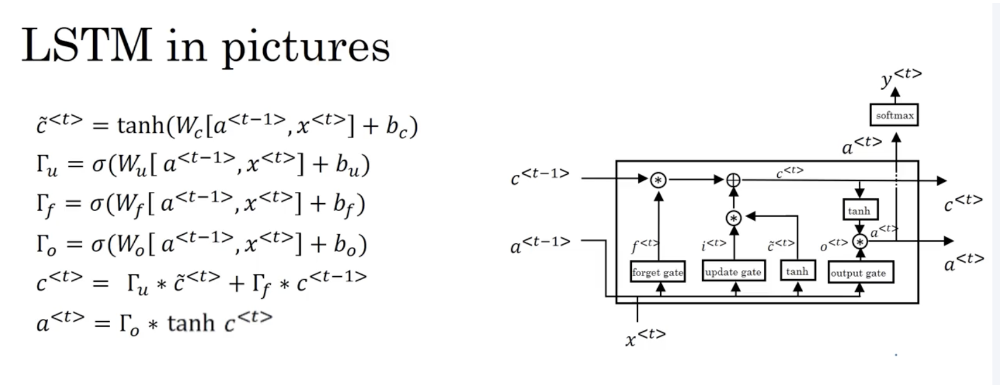

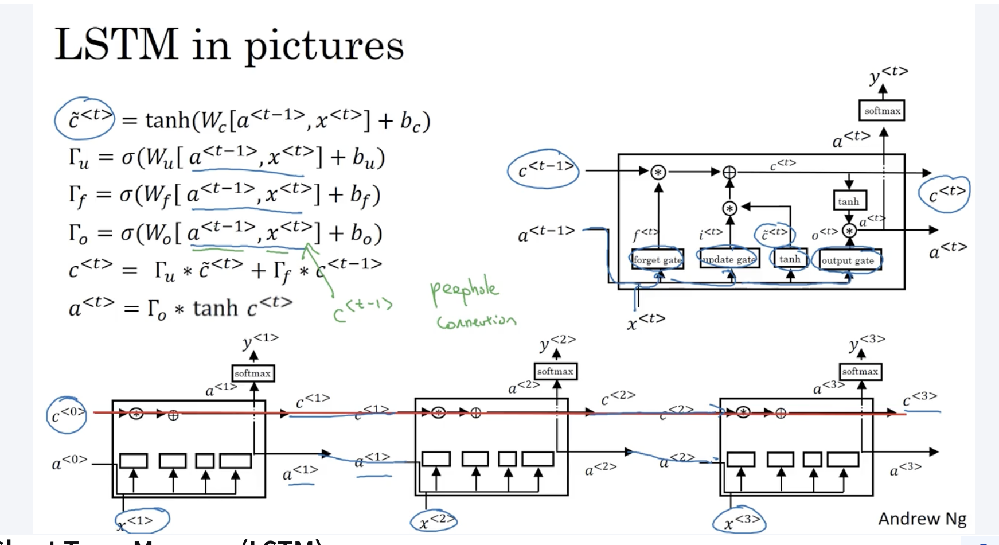

GRU is simpler.
Computationally less complex.
Scales to bigger problems.

LSTM is more powerful.


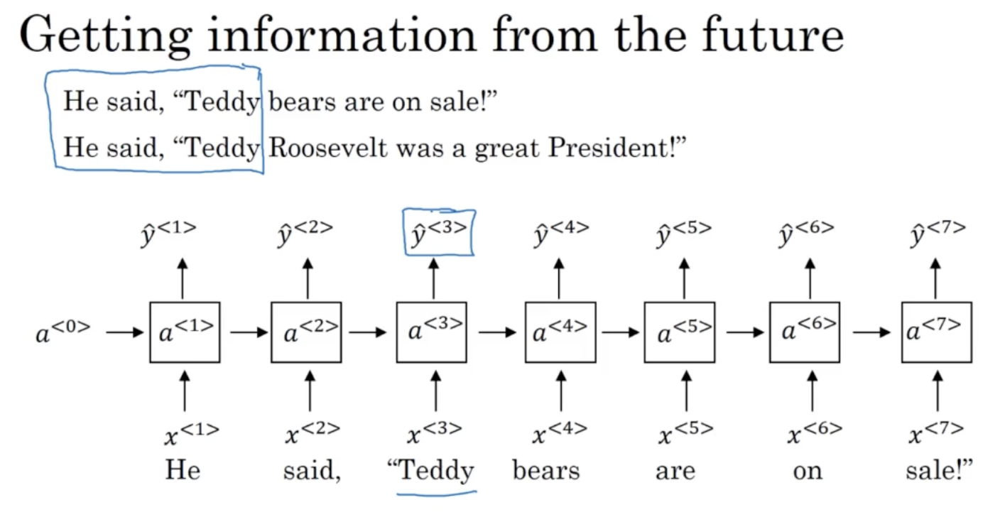

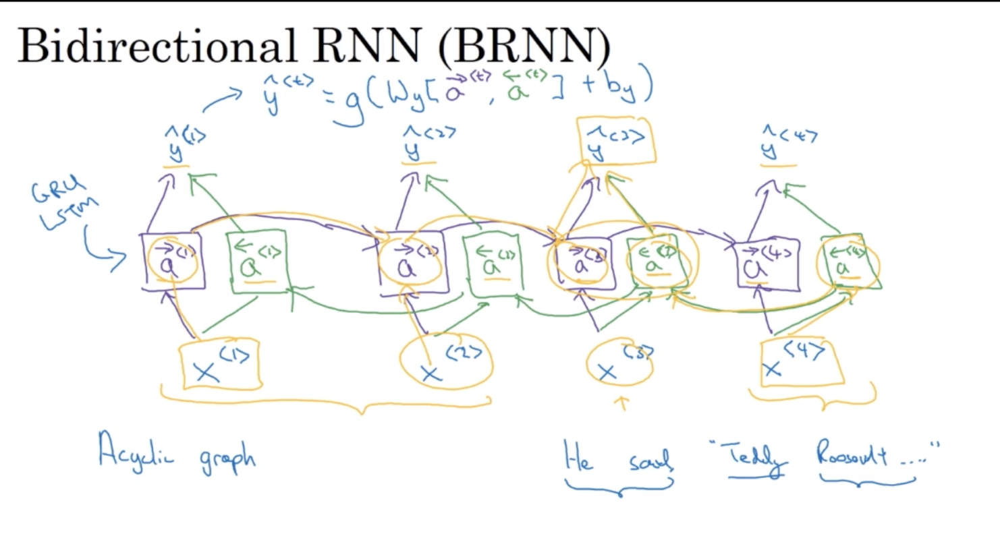

BRNN Disadvantage is you need the entire sequence of data before you can many any prediction.


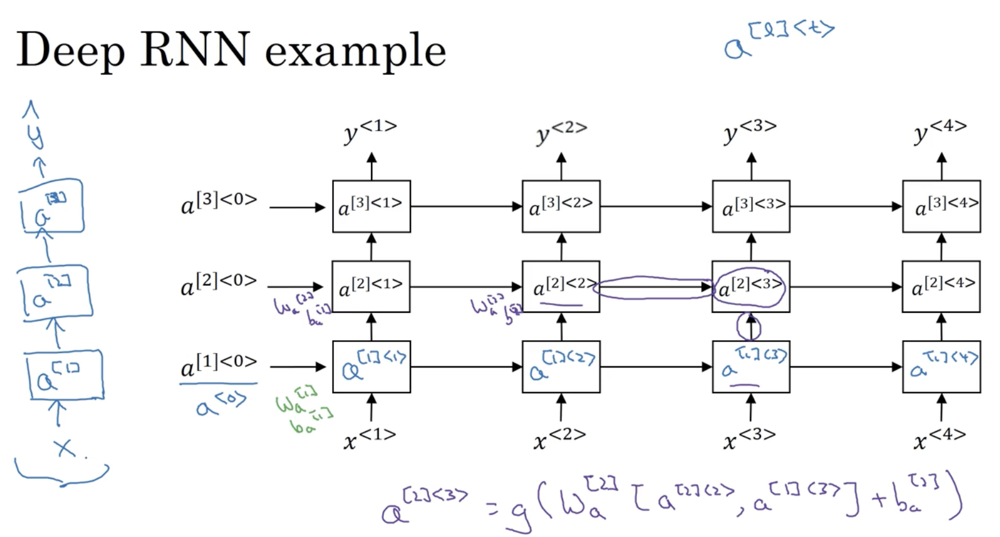

###Notation

$a^{[l]t}$

layer l, time t






### 🧠 GRU Equations (Gated Recurrent Unit)

GRUs use a single **update gate** Γ<sub>u</sub> to combine the previous state and candidate state:


$c^{<t>} = Γ_u · 𝑐̃^{<t>} + (1 - Γ_u) · c^{<t-1>}$


- Γ<sub>u</sub>: Controls how much of the **new** candidate state to use.
- (1 − Γ<sub>u</sub>): Controls how much of the **previous** state to keep.
- There is no separate forget gate—just one gate controlling the blend.

### 🧠 LSTM Equations (Long Short-Term Memory)

LSTMs use **two** separate gates for this purpose:


$c^{<t>} = Γ_u · 𝑐̃^{<t>} + Γ_f · c^{<t-1>}$


- Γ<sub>u</sub> (**input/update gate**): Determines how much of the new candidate state to keep.
- Γ<sub>f</sub> (**forget gate**): Determines how much of the old state to keep.
- Importantly, these two are independent and separately learned—unlike GRU.

### 🔍 Comparing the Roles

| Component             | GRU                                    | LSTM                                           |
|----------------------|-----------------------------------------|------------------------------------------------|
| Uses 1 gate to control old and new state | ✅ (via Γ<sub>u</sub>)     | ❌ (separate gates)                            |
| Proportion of previous state         | (1 − Γ<sub>u</sub>)         | Γ<sub>f</sub>                                   |
| Proportion of new candidate state    | Γ<sub>u</sub>               | Γ<sub>u</sub> (input gate)                      |

So, **yes**, (1 − Γ<sub>u</sub>) in GRU controls the past like the forget gate does in LSTM, and Γ<sub>u</sub> in GRU plays the role of the input/update gate in LSTM.




When an LSTM is said to have **800-dimension activations** (for example, activations denoted as $a^{}$), it means that at each time step t, the hidden state vector output by the LSTM has 800 elements. This is sometimes described as the LSTM having **800 hidden units** or a **hidden size of 800**.

* Each $a^{}$ (the hidden state at time t) is a vector of length 800.

* This dimensionality is set when you configure the LSTM—it’s the hidden_size parameter in most frameworks.

* The 800 values in a^{} collectively describe the “state” the LSTM has learned to represent at that point in the sequence.

So, for a batch of sequences, the activations a^{} at any time step will typically have the shape (batch_size, 800). The number 800 refers to the size of each hidden state vector, not how many time steps or batches are being processed.
In summary: An LSTM with “800-dimension activations” produces a vector of 800 numbers at every time step, representing the learned features of the sequence at that moment